# **Exploratory Data Analysis (EDA)**

In [1]:
# Extract Data
!python3 -m scripts --extract-data --data-path ../data/data.zip --output-path ../ -v
!ls -l ../data/*.csv

-rw-rw-r-- 1 scorpion scorpion 46787887 Dec  7 12:12 ../data/benin-malanville.csv
-rw-rw-r-- 1 scorpion scorpion 45992326 Dec  7 12:12 ../data/sierraleone-bumbuna.csv
-rw-rw-r-- 1 scorpion scorpion 49866437 Dec  7 12:12 ../data/togo-dapaong_qc.csv


In [22]:
# Install Dependencies

!pip install -r ../requirements/production.txt -qqq

In [4]:
# Import modules

import pathlib

import pandas as pd

In [5]:
# Define Constants

DATA_DIR = pathlib.Path("../data")
BENNIN_MALANVILLE_FILE = DATA_DIR / "benin-malanville.csv"
SIERRALEONE_BUMBUNA_FILE = DATA_DIR / "sierraleone-bumbuna.csv"
TOGO_DAPAONG_QC_FILE = DATA_DIR / "togo-dapaong_qc.csv"

In [6]:
# Read Data
bn_df = pd.read_csv(BENNIN_MALANVILLE_FILE)
sl_df = pd.read_csv(SIERRALEONE_BUMBUNA_FILE)
tg_df = pd.read_csv(TOGO_DAPAONG_QC_FILE)

In [7]:
bn_df.head()

,Timestamp,GHI,DNI,DHI,ModA,ModB,Tamb,RH,WS,WSgust,WSstdev,WD,WDstdev,BP,Cleaning,Precipitation,TModA,TModB,Comments
0,2021-08-09 00:01,-1.2,-0.2,-1.1,0.0,0.0,26.2,93.4,0.0,0.4,0.1,122.1,0.0,998,0,0.0,26.3,26.2,NaN
1,2021-08-09 00:02,-1.1,-0.2,-1.1,0.0,0.0,26.2,93.6,0.0,0.0,0.0,0.0,0.0,998,0,0.0,26.3,26.2,NaN
2,2021-08-09 00:03,-1.1,-0.2,-1.1,0.0,0.0,26.2,93.7,0.3,1.1,0.5,124.6,1.5,997,0,0.0,26.4,26.2,NaN
3,2021-08-09 00:04,-1.1,-0.1,-1.0,0.0,0.0,26.2,93.3,0.2,0.7,0.4,120.3,1.3,997,0,0.0,26.4,26.3,NaN
4,2021-08-09 00:05,-1.0,-0.1,-1.0,0.0,0.0,26.2,93.3,0.1,0.7,0.3,113.2,1.0,997,0,0.0,26.4,26.3,NaN


In [8]:
sl_df.head()

,Timestamp,GHI,DNI,DHI,ModA,ModB,Tamb,RH,WS,WSgust,WSstdev,WD,WDstdev,BP,Cleaning,Precipitation,TModA,TModB,Comments
0,2021-10-30 00:01,-0.7,-0.1,-0.8,0.0,0.0,21.9,99.1,0.0,0.0,0.0,0.0,0.0,1002,0,0.0,22.3,22.6,NaN
1,2021-10-30 00:02,-0.7,-0.1,-0.8,0.0,0.0,21.9,99.2,0.0,0.0,0.0,0.0,0.0,1002,0,0.0,22.3,22.6,NaN
2,2021-10-30 00:03,-0.7,-0.1,-0.8,0.0,0.0,21.9,99.2,0.0,0.0,0.0,0.0,0.0,1002,0,0.0,22.3,22.6,NaN
3,2021-10-30 00:04,-0.7,0.0,-0.8,0.0,0.0,21.9,99.3,0.0,0.0,0.0,0.0,0.0,1002,0,0.1,22.3,22.6,NaN
4,2021-10-30 00:05,-0.7,-0.1,-0.8,0.0,0.0,21.9,99.3,0.0,0.0,0.0,0.0,0.0,1002,0,0.0,22.3,22.6,NaN


In [9]:
tg_df.head()

,Timestamp,GHI,DNI,DHI,ModA,ModB,Tamb,RH,WS,WSgust,WSstdev,WD,WDstdev,BP,Cleaning,Precipitation,TModA,TModB,Comments
0,2021-10-25 00:01,-1.3,0.0,0.0,0.0,0.0,24.8,94.5,0.9,1.1,0.4,227.6,1.1,977,0,0.0,24.7,24.4,NaN
1,2021-10-25 00:02,-1.3,0.0,0.0,0.0,0.0,24.8,94.4,1.1,1.6,0.4,229.3,0.7,977,0,0.0,24.7,24.4,NaN
2,2021-10-25 00:03,-1.3,0.0,0.0,0.0,0.0,24.8,94.4,1.2,1.4,0.3,228.5,2.9,977,0,0.0,24.7,24.4,NaN
3,2021-10-25 00:04,-1.2,0.0,0.0,0.0,0.0,24.8,94.3,1.2,1.6,0.3,229.1,4.6,977,0,0.0,24.7,24.4,NaN
4,2021-10-25 00:05,-1.2,0.0,0.0,0.0,0.0,24.8,94.0,1.3,1.6,0.4,227.5,1.6,977,0,0.0,24.7,24.4,NaN


In [10]:
# Check size of data

print(f"Benin-Malanville: {bn_df.shape}")
print(f"Sierra Leone-Bumbuna: {sl_df.shape}")
print(f"Togo-Dapaong: {tg_df.shape}")

Benin-Malanville: (525600, 19)
Sierra Leone-Bumbuna: (525600, 19)
Togo-Dapaong: (525600, 19)


In [11]:
def report_null_columns(df):
    """
    Identifies columns causing NULL values and returns a report.

    Args:
        df (pd.DataFrame): Input DataFrame.

    Returns:
        dict: A dictionary with column names as keys and count of NULL values as values.
    """
    null_report = {col: int(df[col].isnull().sum()) for col in df.columns if df[col].isnull().sum() > 0}
    return null_report

In [12]:
# Check for missing values

print(f"Benin-Malanville: {report_null_columns(bn_df)}")
print(f"Sierra Leone-Bumbuna: {report_null_columns(sl_df)}")
print(f"Togo-Dapaong: {report_null_columns(tg_df)}")

Benin-Malanville: {'Comments': 525600}
Sierra Leone-Bumbuna: {'Comments': 525600}
Togo-Dapaong: {'Comments': 525600}


In [13]:
# Check for duplicate values

print(f"Benin-Malanville: {bn_df.duplicated().sum()}")
print(f"Sierra Leone-Bumbuna: {sl_df.duplicated().sum()}")
print(f"Togo-Dapaong: {tg_df.duplicated().sum()}")

Benin-Malanville: 0
Sierra Leone-Bumbuna: 0
Togo-Dapaong: 0


In [14]:
# Check for data info

print("Benin-Malanville")
print(bn_df.info())

Benin-Malanville
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 525600 entries, 0 to 525599
Data columns (total 19 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Timestamp      525600 non-null  object 
 1   GHI            525600 non-null  float64
 2   DNI            525600 non-null  float64
 3   DHI            525600 non-null  float64
 4   ModA           525600 non-null  float64
 5   ModB           525600 non-null  float64
 6   Tamb           525600 non-null  float64
 7   RH             525600 non-null  float64
 8   WS             525600 non-null  float64
 9   WSgust         525600 non-null  float64
 10  WSstdev        525600 non-null  float64
 11  WD             525600 non-null  float64
 12  WDstdev        525600 non-null  float64
 13  BP             525600 non-null  int64  
 14  Cleaning       525600 non-null  int64  
 15  Precipitation  525600 non-null  float64
 16  TModA          525600 non-null  float64
 17  TModB       

In [15]:
print("\nSierra Leone-Bumbuna")
print(sl_df.info())


Sierra Leone-Bumbuna
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 525600 entries, 0 to 525599
Data columns (total 19 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Timestamp      525600 non-null  object 
 1   GHI            525600 non-null  float64
 2   DNI            525600 non-null  float64
 3   DHI            525600 non-null  float64
 4   ModA           525600 non-null  float64
 5   ModB           525600 non-null  float64
 6   Tamb           525600 non-null  float64
 7   RH             525600 non-null  float64
 8   WS             525600 non-null  float64
 9   WSgust         525600 non-null  float64
 10  WSstdev        525600 non-null  float64
 11  WD             525600 non-null  float64
 12  WDstdev        525600 non-null  float64
 13  BP             525600 non-null  int64  
 14  Cleaning       525600 non-null  int64  
 15  Precipitation  525600 non-null  float64
 16  TModA          525600 non-null  float64
 17  TModB  

In [16]:
print("\nTogo-Dapaong")
print(tg_df.info())


Togo-Dapaong
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 525600 entries, 0 to 525599
Data columns (total 19 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Timestamp      525600 non-null  object 
 1   GHI            525600 non-null  float64
 2   DNI            525600 non-null  float64
 3   DHI            525600 non-null  float64
 4   ModA           525600 non-null  float64
 5   ModB           525600 non-null  float64
 6   Tamb           525600 non-null  float64
 7   RH             525600 non-null  float64
 8   WS             525600 non-null  float64
 9   WSgust         525600 non-null  float64
 10  WSstdev        525600 non-null  float64
 11  WD             525600 non-null  float64
 12  WDstdev        525600 non-null  float64
 13  BP             525600 non-null  int64  
 14  Cleaning       525600 non-null  int64  
 15  Precipitation  525600 non-null  float64
 16  TModA          525600 non-null  float64
 17  TModB          

In [17]:
print("Benin-Malanville")
print(bn_df.describe())


Benin-Malanville
                 GHI            DNI            DHI           ModA  \
count  525600.000000  525600.000000  525600.000000  525600.000000   
mean      240.559452     167.187516     115.358961     236.589496   
std       331.131327     261.710501     158.691074     326.894859   
min       -12.900000      -7.800000     -12.600000       0.000000   
25%        -2.000000      -0.500000      -2.100000       0.000000   
50%         1.800000      -0.100000       1.600000       4.500000   
75%       483.400000     314.200000     216.300000     463.700000   
max      1413.000000     952.300000     759.200000    1342.300000   

                ModB           Tamb             RH             WS  \
count  525600.000000  525600.000000  525600.000000  525600.000000   
mean      228.883576      28.179683      54.487969       2.121113   
std       316.536515       5.924297      28.073069       1.603466   
min         0.000000      11.000000       2.100000       0.000000   
25%         0.00

In [18]:
print("Sierra Leone-Bumbuna")
print(sl_df.describe())

Sierra Leone-Bumbuna
                 GHI            DNI            DHI           ModA  \
count  525600.000000  525600.000000  525600.000000  525600.000000   
mean      201.957515     116.376337     113.720571     206.643095   
std       298.495150     218.652659     158.946032     300.896893   
min       -19.500000      -7.800000     -17.900000       0.000000   
25%        -2.800000      -0.300000      -3.800000       0.000000   
50%         0.300000      -0.100000      -0.100000       3.600000   
75%       362.400000     107.000000     224.700000     359.500000   
max      1499.000000     946.000000     892.000000    1507.000000   

                ModB           Tamb             RH             WS  \
count  525600.000000  525600.000000  525600.000000  525600.000000   
mean      198.114691      26.319394      79.448857       1.146113   
std       288.889073       4.398605      20.520775       1.239248   
min         0.000000      12.300000       9.900000       0.000000   
25%         

In [19]:
print("Togo-Dapaong")
print(tg_df.describe())

Togo-Dapaong
                 GHI            DNI            DHI           ModA  \
count  525600.000000  525600.000000  525600.000000  525600.000000   
mean      230.555040     151.258469     116.444352     226.144375   
std       322.532347     250.956962     156.520714     317.346938   
min       -12.700000       0.000000       0.000000       0.000000   
25%        -2.200000       0.000000       0.000000       0.000000   
50%         2.100000       0.000000       2.500000       4.400000   
75%       442.400000     246.400000     215.700000     422.525000   
max      1424.000000    1004.500000     805.700000    1380.000000   

                ModB           Tamb             RH             WS  \
count  525600.000000  525600.000000  525600.000000  525600.000000   
mean      219.568588      27.751788      55.013160       2.368093   
std       307.932510       4.758023      28.778732       1.462668   
min         0.000000      14.900000       3.300000       0.000000   
25%         0.000000

In [23]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def time_series_analysis(df, group_by='month', columns=['GHI', 'DNI', 'DHI', 'Tamb']):
    """
    Plot time series of specified columns grouped by month or hour.

    Parameters:
    df (DataFrame): Input DataFrame.
    group_by (str): 'month' or 'hour' for grouping.
    columns (list): Columns to analyze.
    """
    df['Timestamp'] = pd.to_datetime(df['Timestamp'])
    if group_by == 'month':
        df['Month'] = df['Timestamp'].dt.month
        group = 'Month'
    elif group_by == 'hour':
        df['Hour'] = df['Timestamp'].dt.hour
        group = 'Hour'
    else:
        raise ValueError("group_by must be 'month' or 'hour'.")

    grouped = df.groupby(group)[columns].mean()
    grouped.plot(kind='line', figsize=(10, 6))
    plt.title(f"Time Series Analysis ({group_by.capitalize()})")
    plt.xlabel(group.capitalize())
    plt.ylabel('Values')
    plt.grid()
    plt.legend(title='Metrics')
    plt.show()

def evaluate_cleaning_impact(df):
    """
    Plot the impact of cleaning on ModA and ModB readings over time.

    Parameters:
    df (DataFrame): Input DataFrame.
    """
    df['Timestamp'] = pd.to_datetime(df['Timestamp'])
    cleaned = df[df['Cleaning'] == 1]
    not_cleaned = df[df['Cleaning'] == 0]

    plt.figure(figsize=(10, 6))
    plt.plot(cleaned['Timestamp'], cleaned['ModA'], label='ModA (Cleaned)', alpha=0.7)
    plt.plot(cleaned['Timestamp'], cleaned['ModB'], label='ModB (Cleaned)', alpha=0.7)
    plt.plot(not_cleaned['Timestamp'], not_cleaned['ModA'], label='ModA (Not Cleaned)', alpha=0.7)
    plt.plot(not_cleaned['Timestamp'], not_cleaned['ModB'], label='ModB (Not Cleaned)', alpha=0.7)
    plt.title("Impact of Cleaning on ModA and ModB")
    plt.xlabel('Timestamp')
    plt.ylabel('Values')
    plt.legend()
    plt.grid()
    plt.show()

def correlation_analysis(df, columns=['GHI', 'DNI', 'DHI', 'TModA', 'TModB', 'WS', 'WSgust', 'WD']):
    """
    Perform and visualize correlation analysis between specified columns.

    Parameters:
    df (DataFrame): Input DataFrame.
    columns (list): Columns to analyze correlations for.
    """
    corr_matrix = df[columns].corr()

    # Heatmap
    plt.figure(figsize=(10, 6))
    sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f')
    plt.title("Correlation Matrix")
    plt.show()

    # Pairplot
    sns.pairplot(df[columns])
    plt.suptitle("Scatter Matrix Analysis", y=1.02)
    plt.show()


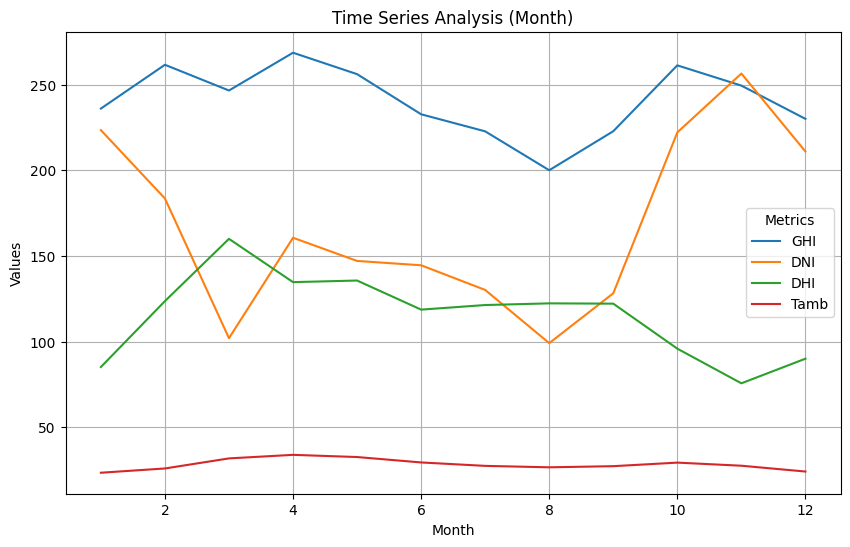

In [25]:
time_series_analysis(bn_df)

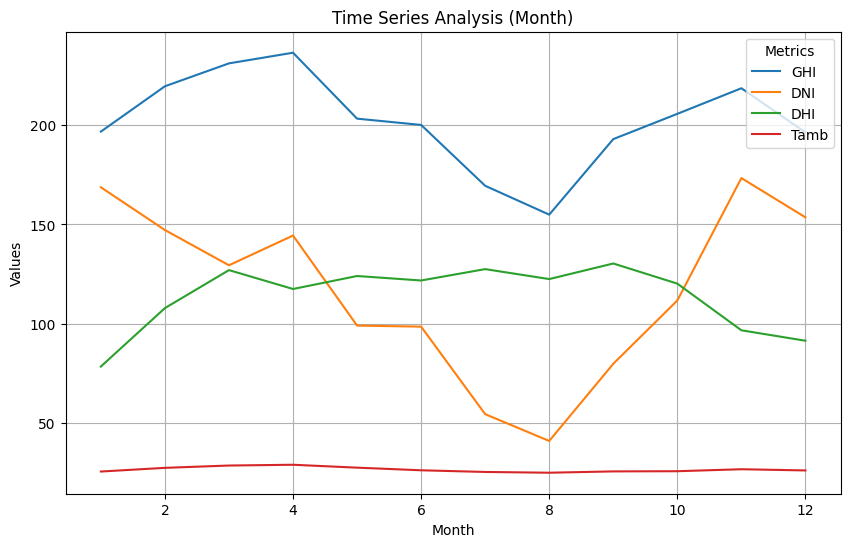

In [26]:
time_series_analysis(sl_df)

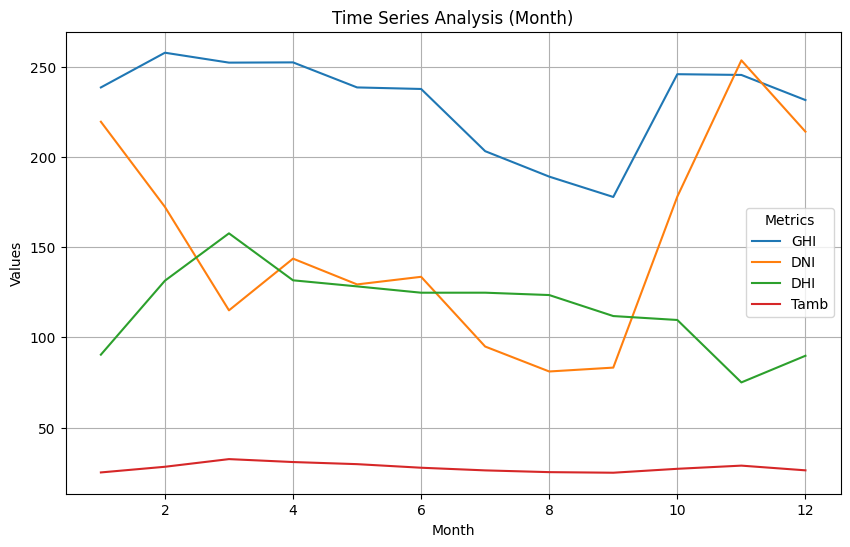

In [27]:
time_series_analysis(tg_df)

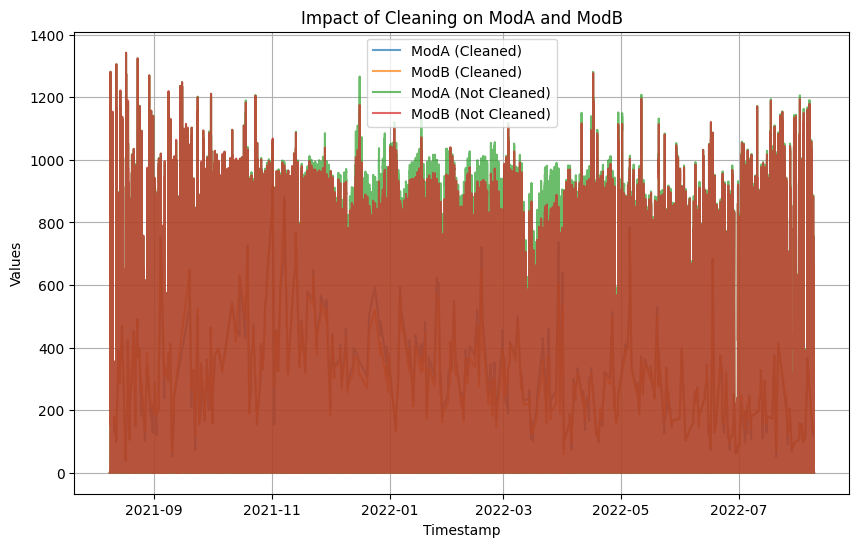

In [28]:
evaluate_cleaning_impact(bn_df)

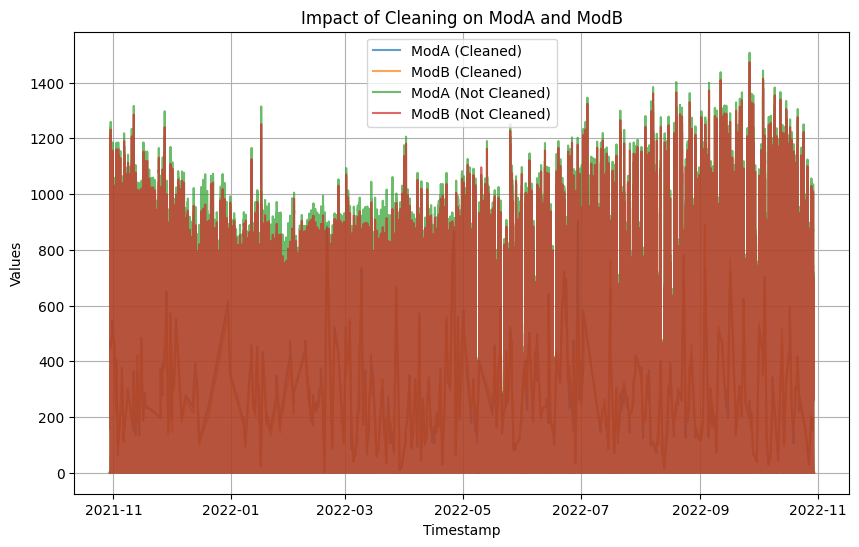

In [29]:
evaluate_cleaning_impact(sl_df)

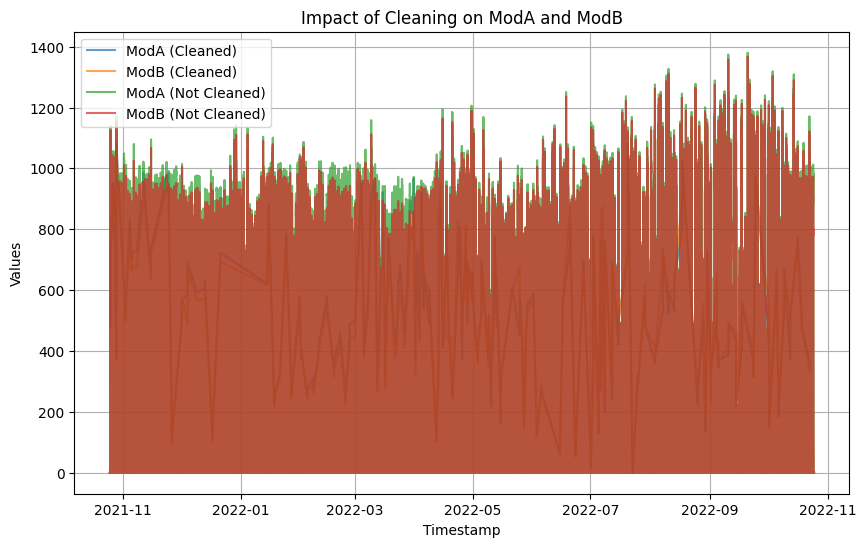

In [30]:
evaluate_cleaning_impact(tg_df)

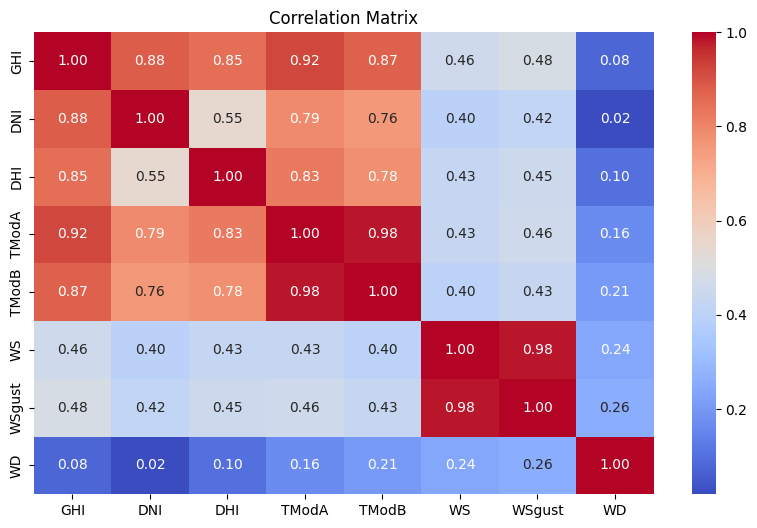

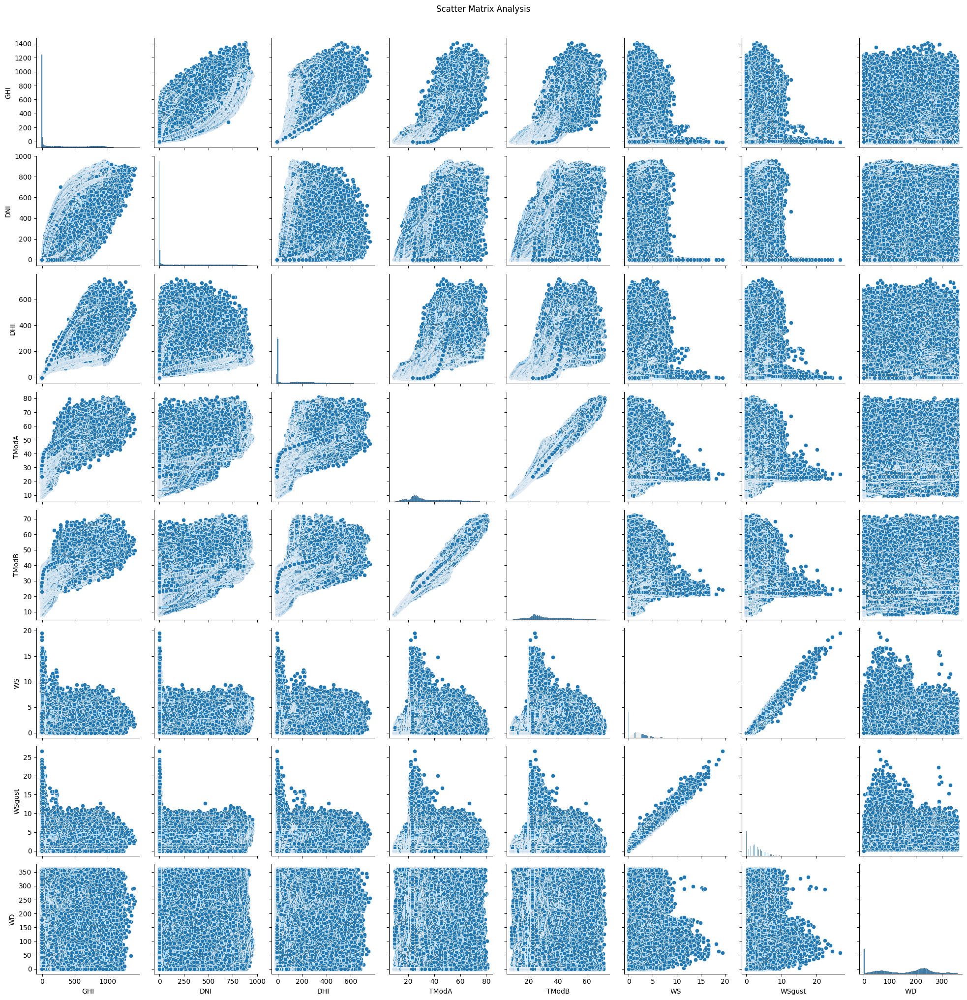

In [31]:
correlation_analysis(bn_df)

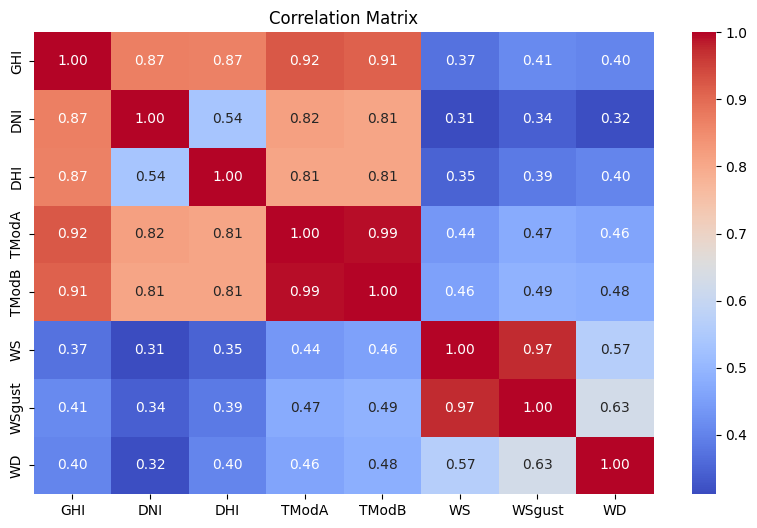

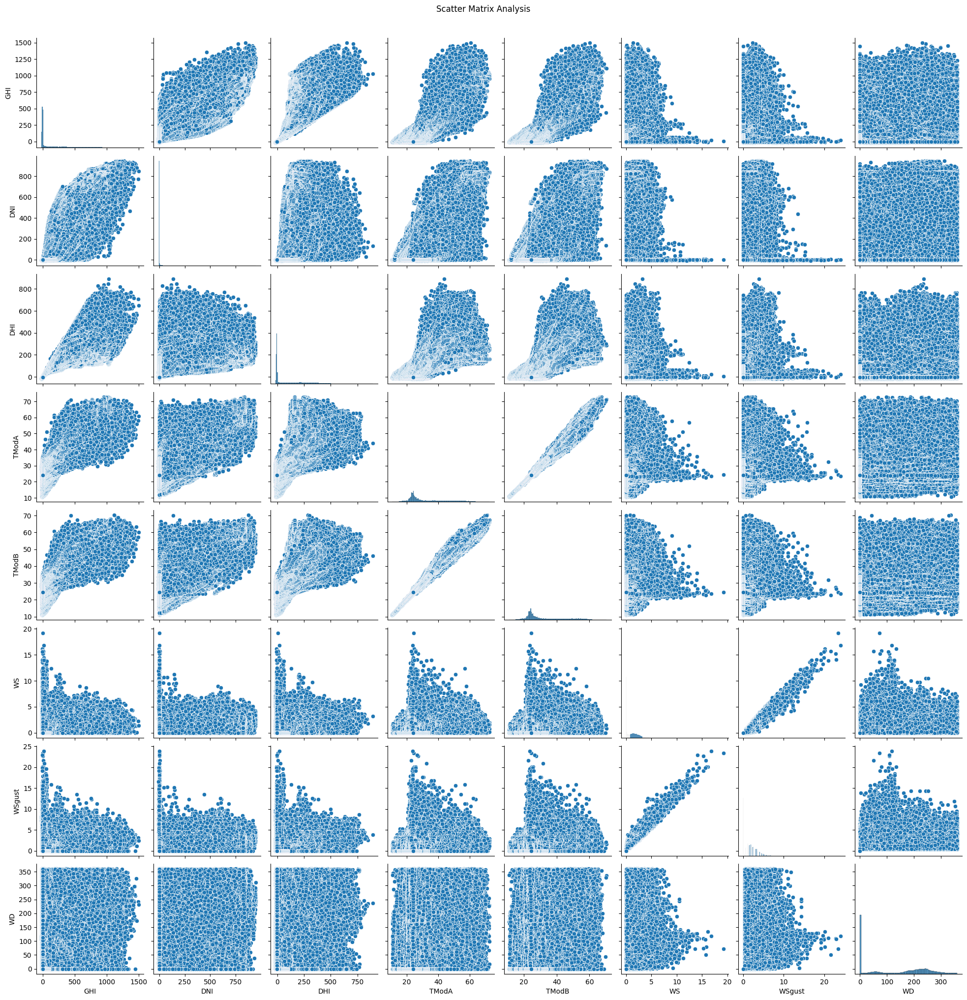

In [33]:
correlation_analysis(sl_df)

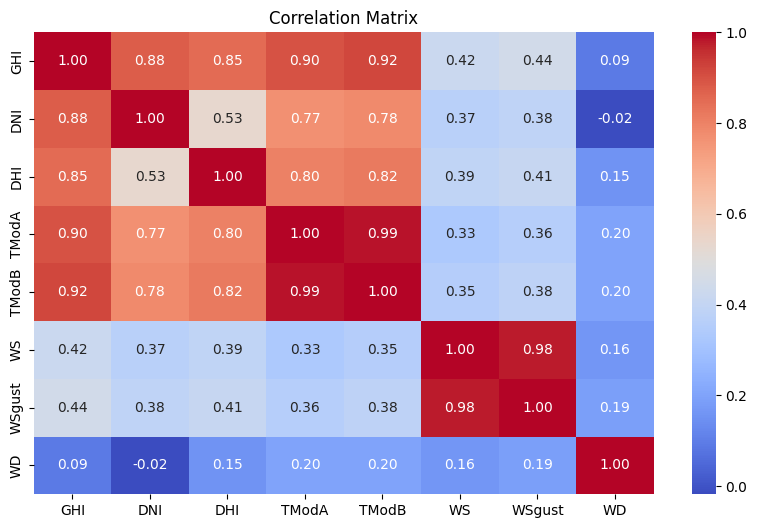

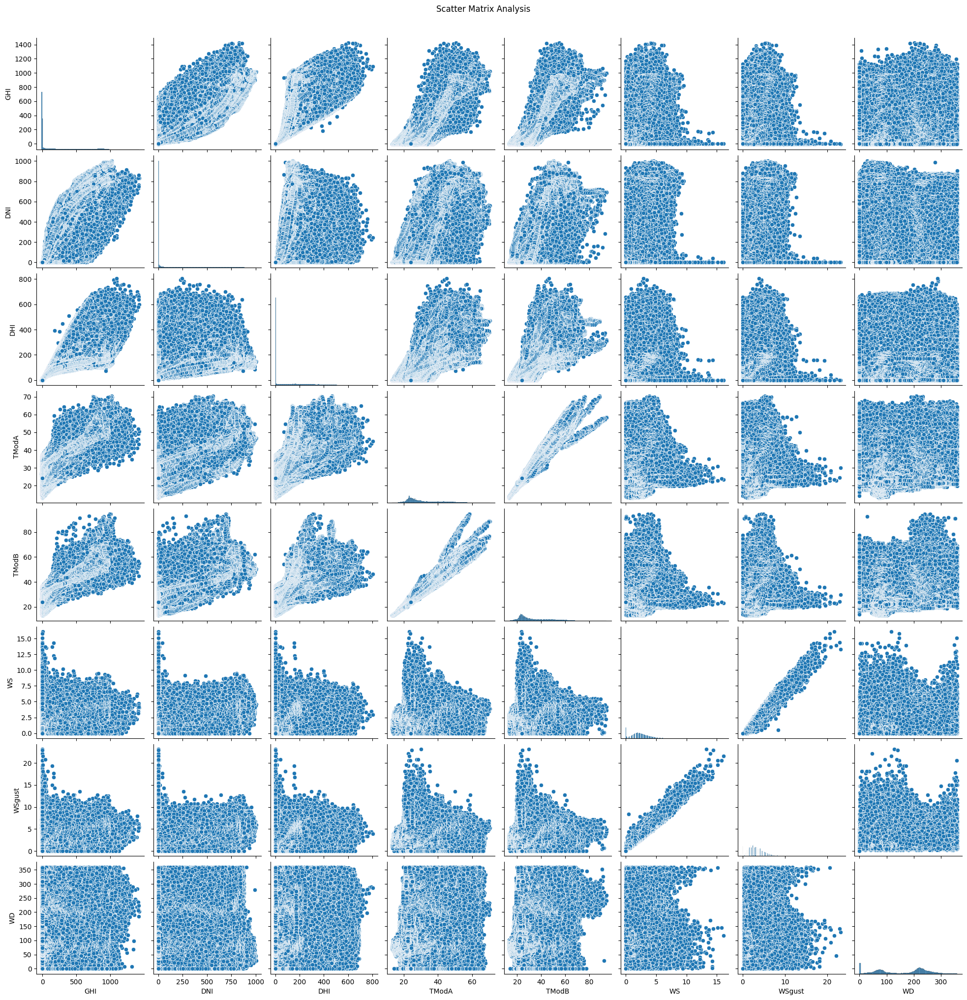

In [34]:
correlation_analysis(tg_df)